# Install Detectron2

In [ ]:
!python -m pip install -q pyyaml==5.1 pycocotools>=2.0.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install --quiet {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15737, done.
remote: Counting objects: 100% (460/460), done.
remote: Compressing objects: 100% (333/333), done.
remote: Total 15737 (delta 211), reused 305 (delta 118), pack-reused 15277
Receiving objects: 100% (15737/15737), 6.52 MiB | 16.28 MiB/s, done.
Resolving deltas: 100% (11326/11326), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 4.9 MB/s eta 0:00:0

In [ ]:
import torch, torchvision, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

import tqdm
import time

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

# Register datasets

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train_ds", {}, "/content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/train/labels/train/train.json", "/content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/train/images/train")
register_coco_instances("val_ds", {}, "/content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/val/labels/train/val.json", "/content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/val/images/train")


In [ ]:
train_metadata = MetadataCatalog.get("train_ds")
train_dataset_dicts = DatasetCatalog.get("train_ds")

[06/25 18:39:06 d2.data.datasets.coco]: Loading /content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/train/labels/train/train.json takes 2.67 seconds.
[06/25 18:39:06 d2.data.datasets.coco]: Loaded 1898 images in COCO format from /content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/train/labels/train/train.json


In [ ]:
val_metadata = MetadataCatalog.get("val_ds")
val_dataset_dicts = DatasetCatalog.get("val_ds")

[06/25 18:39:08 d2.data.datasets.coco]: Loading /content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/val/labels/train/val.json takes 1.29 seconds.
[06/25 18:39:08 d2.data.datasets.coco]: Loaded 1306 images in COCO format from /content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/val/labels/train/val.json


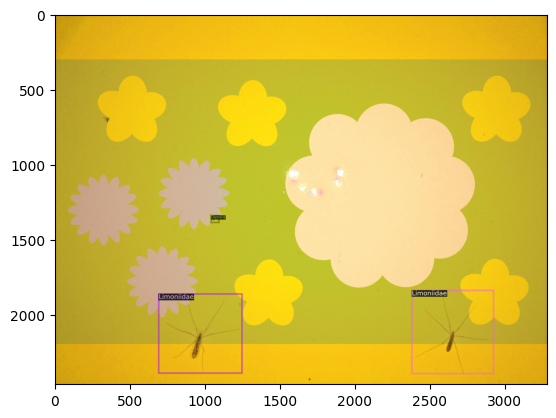

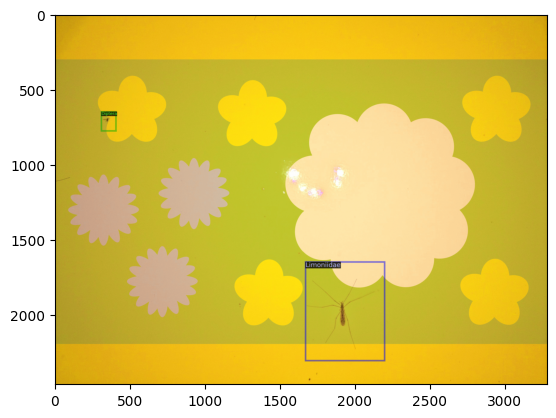

In [ ]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image())
    plt.show()

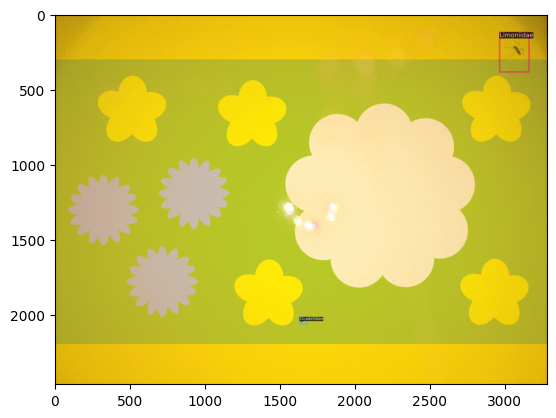

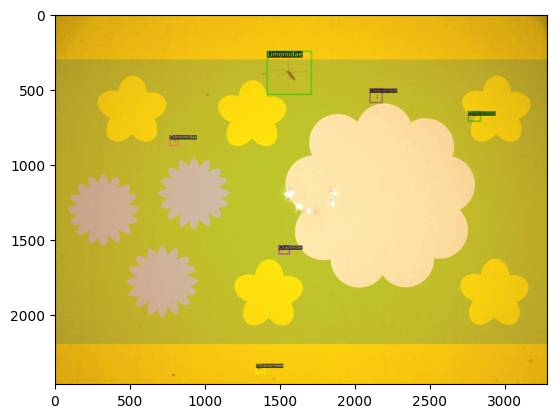

In [ ]:
# Visualize some random samples
for d in random.sample(val_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image())
    plt.show()

In [ ]:
# Create a config file
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("train_ds",)
cfg.DATALOADER.NUM_WORKERS = 4 #8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025 #0.025
cfg.SOLVER.MAX_ITER = 9000  # Adjust as needed
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256 #512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 85  # Adjust for your dataset
cfg.OUTPUT_DIR = "/content/drive/MyDrive/diopsis_coco_split_flowers/results1"
# Size of the smallest side of the image during training
cfg.INPUT.MIN_SIZE_TRAIN = (770,)
# Sample size of smallest side by choice or random selection from range give by
# INPUT.MIN_SIZE_TRAIN
# Maximum size of the side of the image during training
cfg.INPUT.MAX_SIZE_TRAIN = 1026
# Size of the smallest side of the image during testing. Set to zero to disable resize in testing.
cfg.INPUT.MIN_SIZE_TEST = 770
# Maximum size of the side of the image during testing
cfg.INPUT.MAX_SIZE_TEST = 1026

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/25 18:39:38 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_68b088.pkl: 421MB [00:01, 211MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[06/25 18:39:41 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[06/25 18:41:07 d2.utils.events]:  eta: 9:50:04  iter: 19  total_loss: 7.203  loss_cls: 4.455  loss_box_reg: 0.1413  loss_rpn_cls: 2.281  loss_rpn_loc: 0.2213    time: 3.9588  last_time: 4.0128  data_time: 0.1137  last_data_time: 0.0151   lr: 4.9953e-06  max_mem: 8924M
[06/25 18:42:33 d2.utils.events]:  eta: 10:08:32  iter: 39  total_loss: 5.853  loss_cls: 4.189  loss_box_reg: 0.1596  loss_rpn_cls: 1.101  loss_rpn_loc: 0.2996    time: 4.0537  last_time: 4.2403  data_time: 0.0153  last_data_time: 0.0204   lr: 9.9902e-06  max_mem: 10422M
[06/25 18:43:56 d2.utils.events]:  eta: 10:05:58  iter: 59  total_loss: 4.559  loss_cls: 3.845  loss_box_reg: 0.1671  loss_rpn_cls: 0.1371  loss_rpn_loc: 0.2875    time: 4.0734  last_time: 4.0514  data_time: 0.0135  last_data_time: 0.0126   lr: 1.4985e-05  max_mem: 10422M
[06/25 18:45:18 d2.utils.events]:  eta: 10:04:15  iter: 79  total_loss: 3.799  loss_cls: 3.236  loss_box_reg: 0.2541  loss_rpn_cls: 0.07653  loss_rpn_loc: 0.2616    time: 4.0846  last_t

FileNotFoundError: [Errno 2] No such file or directory: 'datasets/coco/annotations/instances_val2017.json'

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

# Evaluation metrics

In [10]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Evaluate on the test dataset
evaluator = COCOEvaluator("val_ds", cfg, False, output_dir=cfg.OUTPUT_DIR + "/validation/")
val_loader = build_detection_test_loader(cfg, "val_ds")
inf_on_dataset = inference_on_dataset(trainer.model, val_loader, evaluator)
print(inf_on_dataset)

[06/26 05:00:29 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [06/26 05:00:29 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[06/26 05:00:29 d2.data.datasets.coco]: Loaded 1306 images in COCO format from /content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/val/labels/train/val.json
[06/26 05:00:29 d2.data.build]: Distribution of instances among all 85 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|   Acrididae   | 2            |    Agapeta    | 0            | Agapeta ham.. | 22           |
|   Animalia    | 20           | Anisopodidae  | 0            |   Aphididae   | 90           |
|    Apidae     | 6            |   Arachnida   | 5            |    Araneae    | 9

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[06/26 05:00:36 d2.evaluation.evaluator]: Inference done 11/1306. Dataloading: 0.1362 s/iter. Inference: 0.2927 s/iter. Eval: 0.0021 s/iter. Total: 0.4310 s/iter. ETA=0:09:18
[06/26 05:00:41 d2.evaluation.evaluator]: Inference done 20/1306. Dataloading: 0.2314 s/iter. Inference: 0.2984 s/iter. Eval: 0.0018 s/iter. Total: 0.5323 s/iter. ETA=0:11:24
[06/26 05:00:46 d2.evaluation.evaluator]: Inference done 31/1306. Dataloading: 0.2325 s/iter. Inference: 0.2738 s/iter. Eval: 0.0016 s/iter. Total: 0.5087 s/iter. ETA=0:10:48
[06/26 05:00:51 d2.evaluation.evaluator]: Inference done 45/1306. Dataloading: 0.1937 s/iter. Inference: 0.2631 s/iter. Eval: 0.0013 s/iter. Total: 0.4588 s/iter. ETA=0:09:38
[06/26 05:00:57 d2.evaluation.evaluator]: Inference done 54/1306. Dataloading: 0.2269 s/iter. Inference: 0.2646 s/iter. Eval: 0.0014 s/iter. Total: 0.4936 s/iter. ETA=0:10:18
[06/26 05:01:02 d2.evaluation.evaluator]: Inference done 62/1306. Dataloading: 0.2442 s/iter. Inference: 0.2692 s/iter. Eval:

# Use a Trained Model

In [ ]:
from detectron2.checkpoint import DetectionCheckpointer

In [ ]:
checkpointer = DetectionCheckpointer(trainer.model, save_dir=cfg.OUTPUT_DIR)

In [ ]:
f = open('config.yml','w')
f.write(cfg.dump())
f.close()

In [ ]:
# # Save model weights
# trainer.save_model(cfg.OUTPUT_DIR + "/model_final.pth")

# Load model weights for inference
# cfg.MODEL.WEIGHTS = cfg.OUTPUT_DIR + "/model_final.pth"
cfg.MODEL.WEIGHTS = cfg.OUTPUT_DIR + "/model_0004999.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[06/10 10:32:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/diopsis_coco_split_flowers/results/model_0004999.pth ...


In [ ]:
evaluator = COCOEvaluator("val_ds", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val_ds")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[06/05 22:08:43 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[06/05 22:08:43 d2.data.datasets.coco]: Loaded 1306 images in COCO format from /content/drive/MyDrive/diopsis_coco_split_flowers/dataset_yoloSplit/val/labels/train/val.json
[06/05 22:08:43 d2.data.build]: Distribution of instances among all 85 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|   Acrididae   | 2            |    Agapeta    | 0            | Agapeta ham.. | 22           |
|   Animalia    | 20           | Anisopodidae  | 0            |   Aphididae   | 90           |
|    Apidae     | 6            |   Arachnida   | 5            |    Araneae    | 99           |
|   Arctiidae   | 8            | Auchenorrhy.. | 102          |   Baetidae    | 3            |
|    Cabera     | 0            |   Caenidae    | 1926        

[06/10 11:19:08 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/diopsis_coco_split_flowers/results/model_0004999.pth ...


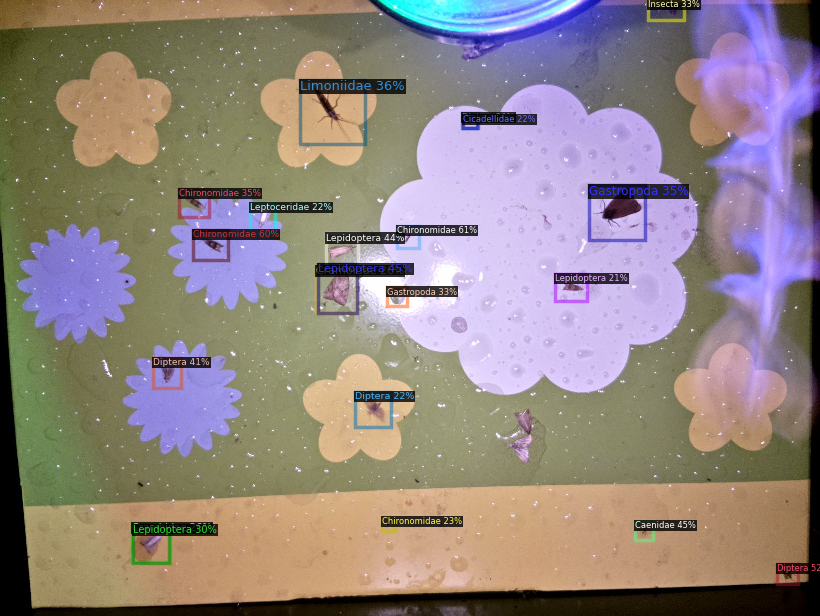

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import Visualizer, ColorMode
import matplotlib.pyplot as plt

cfg = get_cfg()
cfg.merge_from_file('/content/drive/MyDrive/diopsis_coco_split_flowers/results/config.yml')
cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/diopsis_coco_split_flowers/results/model_0004999.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
# cfg.DATASETS.TRAIN = ("train_ds",)
predictor = DefaultPredictor(cfg)

im = cv2.imread('/content/drive/MyDrive/diopsis_test_images/20230716001703.jpg')
outputs = predictor(im)

thing_classes = {'thing_classes':['Acrididae',
                         'Agapeta',
                         'Agapeta hamana',
                         'Animalia',
                         'Anisopodidae',
                         'Aphididae',
                         'Apidae',
                         'Arachnida',
                         'Araneae',
                         'Arctiidae',
                         'Auchenorrhyncha indet.',
                         'Baetidae',
                         'Cabera',
                         'Caenidae',
                         'Carabidae',
                         'Cecidomyiidae',
                         'Ceratopogonidae',
                         'Cercopidae',
                         'Chironomidae',
                         'Chrysomelidae',
                         'Chrysopidae',
                         'Chrysoteuchia culmella',
                         'Cicadellidae',
                         'Coccinellidae',
                         'Coleophoridae',
                         'Coleoptera',
                         'Collembola',
                         'Corixidae',
                         'Crambidae',
                         'Culicidae',
                         'Curculionidae',
                         'Dermaptera',
                         'Diptera',
                         'Eilema',
                         'Empididae',
                         'Ephemeroptera',
                         'Erebidae',
                         'Fanniidae',
                         'Formicidae',
                         'Gastropoda',
                         'Gelechiidae',
                         'Geometridae',
                         'Hemiptera',
                         'Hydroptilidae',
                         'Hymenoptera',
                         'Ichneumonidae',
                         'Idaea',
                         'Insecta',
                         'Lepidoptera',
                         'Leptoceridae',
                         'Limoniidae',
                         'Lomaspilis marginata',
                         'Miridae',
                         'Mycetophilidae',
                         'Nepticulidae',
                         'Neuroptera',
                         'Noctuidae',
                         'Notodontidae',
                         'Object',
                         'Opiliones',
                         'Orthoptera',
                         'Panorpa germanica',
                         'Panorpa vulgaris',
                         'Parasitica indet.',
                         'Plutellidae',
                         'Psocodea',
                         'Psychodidae',
                         'Pterophoridae',
                         'Pyralidae',
                         'Pyrausta',
                         'Sepsidae',
                         'Spilosoma',
                         'Staphylinidae',
                         'Stratiomyidae',
                         'Syrphidae',
                         'Tettigoniidae',
                         'Tipulidae',
                         'Tomoceridae',
                         'Tortricidae',
                         'Trichoptera',
                         'Triodia sylvina',
                         'Yponomeuta',
                         'Yponomeutidae']}

v = Visualizer(im[:, :, ::-1],
               thing_classes,
               scale=0.5)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

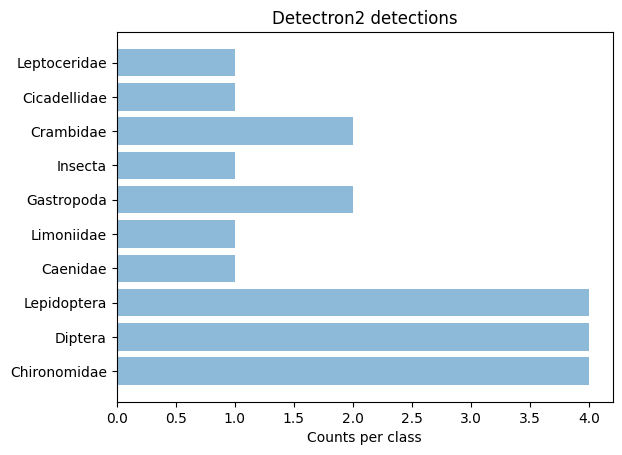

In [ ]:
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

def _create_text_labels(classes, class_names):
    labels = None
    if classes is not None:
        if class_names is not None and len(class_names) > 0:
            labels = [class_names[i] for i in classes]
        else:
            labels = [str(i) for i in classes]
    return labels

scores = outputs['instances'].to('cpu').scores if outputs['instances'].to('cpu').has("scores") else None
classes = outputs['instances'].to('cpu').pred_classes.tolist() if outputs['instances'].to('cpu').has("pred_classes") else None
labels = _create_text_labels(classes, thing_classes['thing_classes'])

letter_counts = Counter(labels)

classes = letter_counts.keys()
y_pos = np.arange(len(classes))
frequencies = [letter_counts[k] for k in classes]

plt.barh(y_pos, frequencies, align='center', alpha=0.5)
plt.yticks(y_pos, classes)
plt.xlabel('Counts per class')
plt.title('Detectron2 detections')

plt.show()

In [ ]:
import detectron2
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2 import model_zoo

# Create a config file
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.OUTPUT_DIR = "/content/drive/MyDrive/diopsis_coco_split_flowers/results"

# Load model weights for inference
cfg.MODEL.WEIGHTS = cfg.OUTPUT_DIR + "/model_0004999.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

# Run inference
im = cv2.imread("/content/drive/MyDrive/diopsis_test_images/20230716001703.jpg")
outputs = predictor(im)

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Run inference
im = cv2.imread("/content/drive/MyDrive/DIOPSIS/DIOPSIS_images/2023-08-10/756/20230810140356.jpg")
outputs = predictor(im)

In [ ]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

Output hidden; open in https://colab.research.google.com to view.